# **IMPORTING REQUIRED LIBRARIES**




In [0]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io
from skimage.transform import resize
from imgaug import augmenters as iaa
from tqdm import tqdm
import PIL
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

WORKERS = 2
CHANNEL = 3

import warnings
warnings.filterwarnings("ignore")
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000 # use 1000 when you just want to explore new idea, use -1 for full train

Using TensorFlow backend.


#**MOUNTING THE DRIVE**




In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


#**1. INTRODUCTION**

> **Reducing lighting-condition effects** : as we will see, images come with many different lighting conditions, some images are very dark and difficult to visualize. We can try to convert the image to gray scale, and visualize better. Alternatively, there is a better approach. We can try the method of Ben Graham (last competition's winner)



In [0]:
df_train = pd.read_csv('drive/My Drive/csv file/train.csv')
df_test = pd.read_csv('drive/My Drive/csv file/test.csv')

x = df_train['id_code']
y = df_train['diagnosis']

x, y = shuffle(x, y, random_state=SEED)

(3112,) (3112,) (550,) (550,)


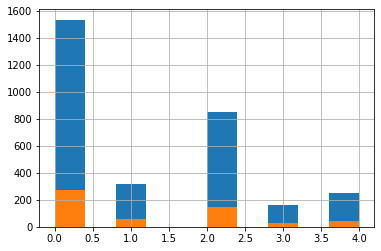

In [0]:
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15,
                                                      stratify=y, random_state=SEED)
print(train_x.shape, train_y.shape, valid_x.shape, valid_y.shape)
train_y.hist()
valid_y.hist()

#**1.1 Simple picture to explain Diabetic Retinopathy**

How do we know that a patient have diabetic retinopahy? There are at least 5 things to spot on.

![](https://sa1s3optim.patientpop.com/assets/images/provider/photos/1947516.jpeg)

#**1.2 Original Inputs**

First, let have a glance of original inputs. Each row depicts each severity level. We can see two problems which make the severity difficult to spot on. First, some images are very dark [pic(0,2) and pic(4,4) ] and sometimes different color illumination is confusing [pic (3,3)]. 

Second, we can get the uninformative dark areas for some pictures [pic(0,1), pic(0,3)]. This is important when we reduce the picture size, as informative areas become too small. So it is intuitive to crop the uninformative areas out in the second case.

CPU times: user 3 s, sys: 71 ms, total: 3.07 s
Wall time: 20.4 s


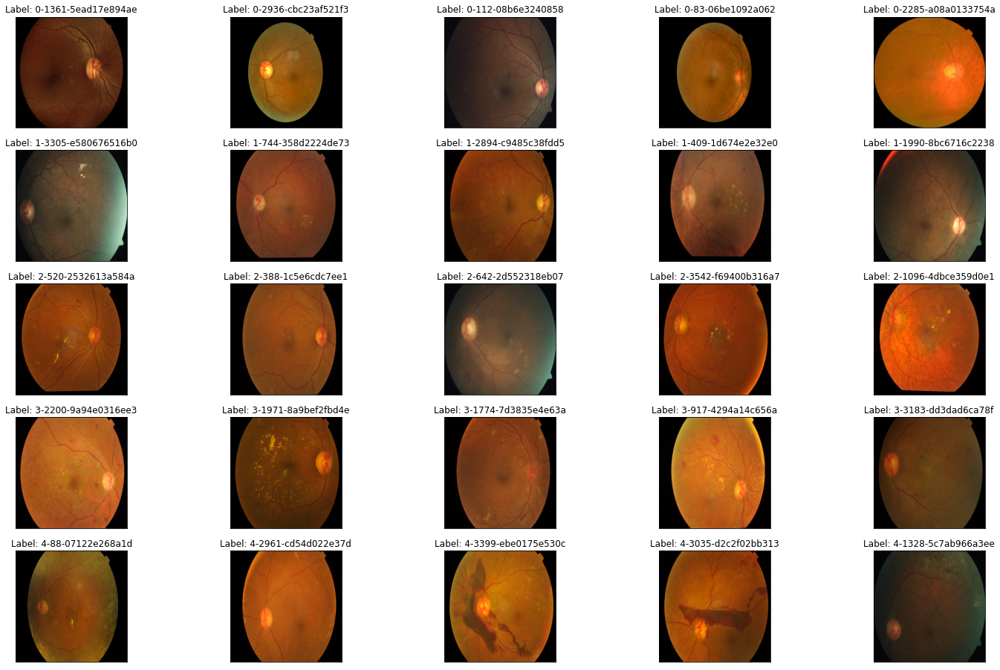

In [0]:
%%time
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"drive/My Drive/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

**We can try gray scale and feel understand better for some pictures, as color distraction is gone. For example, we can see more blood clearer in the upper part of pic(4,4), which has severity of level 4.**

CPU times: user 2.71 s, sys: 47.1 ms, total: 2.75 s
Wall time: 2.74 s


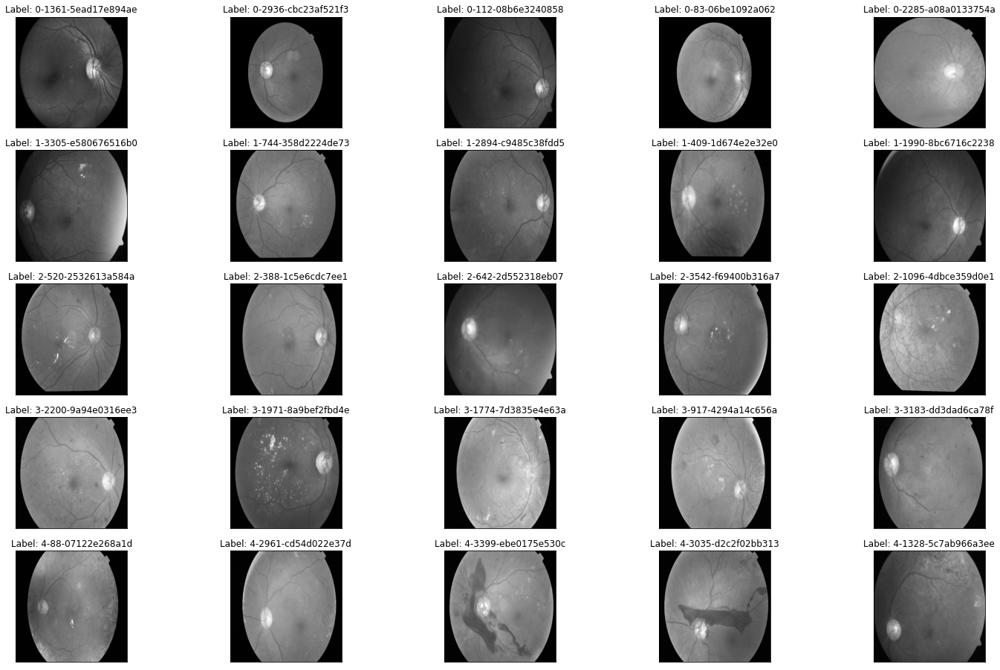

In [0]:
%%time
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"drive/My Drive/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        #image=cv2.addWeighted ( image, 0 , cv2.GaussianBlur( image , (0 ,0 ) , 10) ,-4 ,128)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

**For severity level 4, I feel that two examples here are difficult to spot on, pic(4,1) and pic(4,4). As we try zooming to see the details (use real size image), we can see some abnormalities (cotton wool spots or hard exudates ?) in those eyes clearer (observe the lower-right part of the eye). Therefore, IMG_SIZE is definitely important for this problem.**

1958 2588


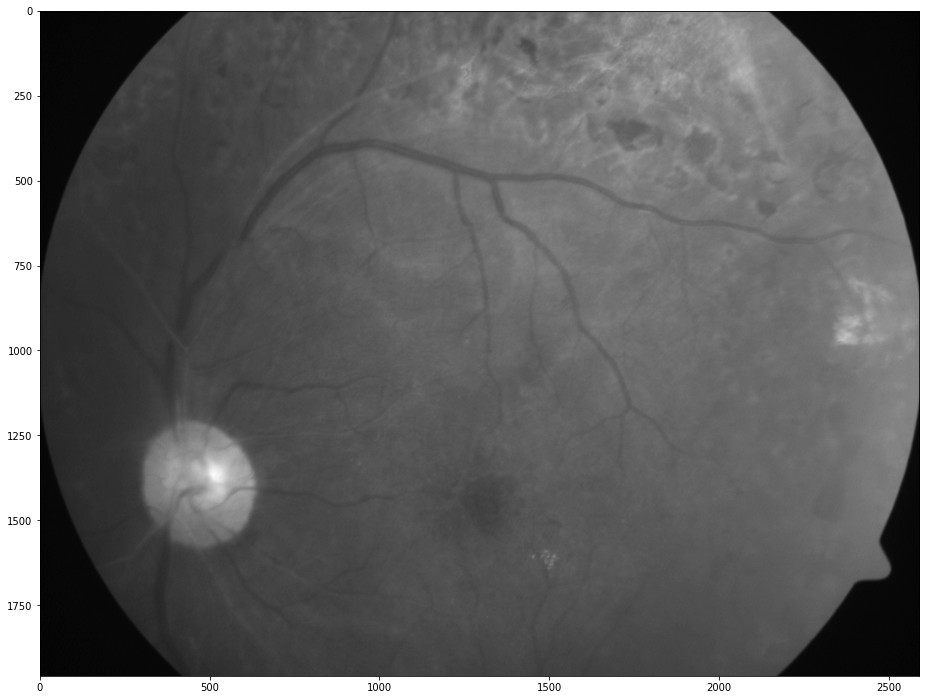

In [0]:
dpi = 80 #inch

path=f"drive/My Drive/train_images/5c7ab966a3ee.png" # notice upper part
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
height, width = image.shape
print(height, width)

SCALE=2
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

2136 3216


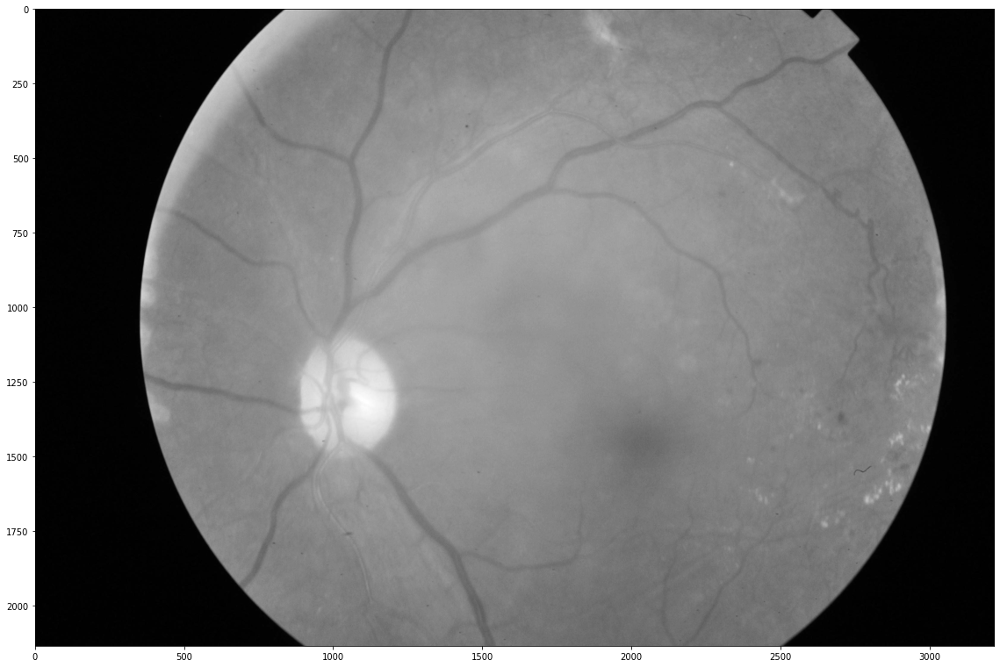

In [0]:
dpi = 80 #inch
path=f"drive/My Drive/train_images/cd54d022e37d.png" # lower-right, this still looks not so severe, can be class3
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
height, width = image.shape
print(height, width)

SCALE=2
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

# **2. Trying Ben Graham's preprocessing method.**

CPU times: user 12.9 s, sys: 69.7 ms, total: 13 s
Wall time: 8.04 s


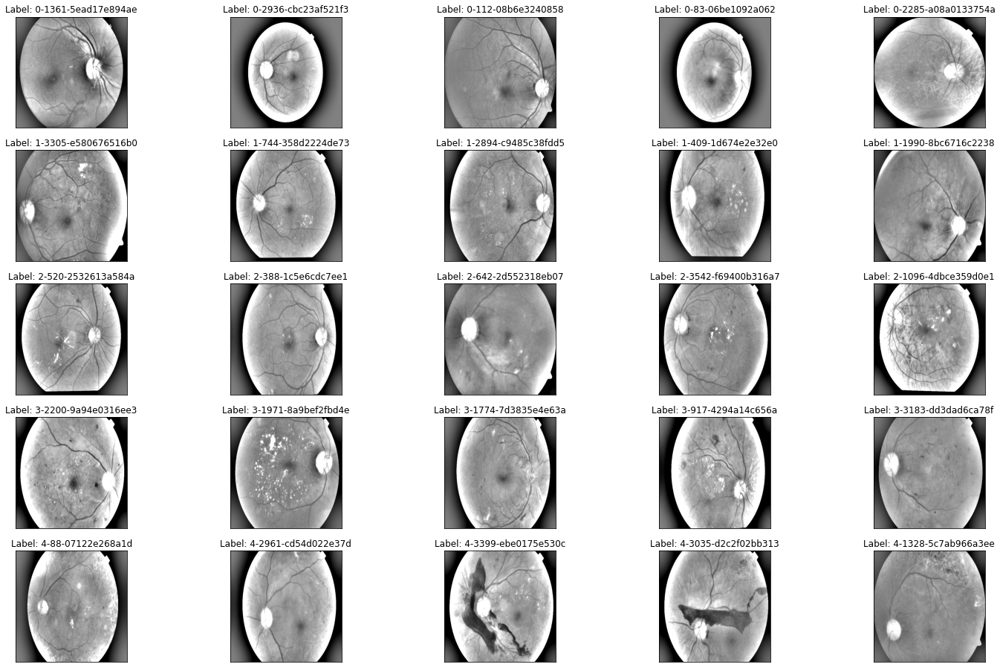

In [0]:
%%time
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"drive/My Drive/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )


# **3. Further improve by auto-cropping**

To crop out the uninformative black areas which are evident on pic(0,1), pic(0,3) and pic(4,1), we can try auto cropping. I found 4 alternative codes from https://stackoverflow.com/questions/13538748/crop-black-edges-with-opencv and https://codereview.stackexchange.com/questions/132914/crop-black-border-of-image-using-numpy/132934 ... Fortunately one method works perfectly for a gray scale image, but none works on a color image.

In [0]:
def crop_image1(img,tol=7):
    # img is image data
    # tol  is tolerance
        
    mask = img>tol
    return img[np.ix_(mask.any(1),mask.any(0))]

def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
            #print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
            #print(img.shape)
        return img

In [0]:
# OLD version of image color cropping, use crop_image_from_gray instead
# The above code work only for 1-channel. Here is my simple extension for 3-channels image
def crop_image(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        h,w,_=img.shape
#         print(h,w)
        img1=cv2.resize(crop_image1(img[:,:,0]),(w,h))
        img2=cv2.resize(crop_image1(img[:,:,1]),(w,h))
        img3=cv2.resize(crop_image1(img[:,:,2]),(w,h))
        
#         print(img1.shape,img2.shape,img3.shape)
        img[:,:,0]=img1
        img[:,:,1]=img2
        img[:,:,2]=img3
        return img

'''all of these do not work'''

def crop_image2(image,threshold=5):
    if len(image.shape) == 3:
        flatImage = np.max(image, 2)
    else:
        flatImage = image
    assert len(flatImage.shape) == 2

    rows = np.where(np.max(flatImage, 0) > threshold)[0]
    if rows.size:
        cols = np.where(np.max(flatImage, 1) > threshold)[0]
        image = image[cols[0]: cols[-1] + 1, rows[0]: rows[-1] + 1]
    else:
        image = image[:1, :1]

    return image

def crop_image3(image):
    mask = image > 0

    # Coordinates of non-black pixels.
    coords = np.argwhere(mask)

    # Bounding box of non-black pixels.
    x0, y0 = coords.min(axis=0)
    x1, y1 = coords.max(axis=0) + 1   # slices are exclusive at the top
    
    # Get the contents of the bounding box.
    cropped = image[x0:x1, y0:y1]
    return cropped

def crop_image4(image):
    _,thresh = cv2.threshold(image,1,255,cv2.THRESH_BINARY)
    contours,hierarchy = cv2.findContours(thresh,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    x,y,w,h = cv2.boundingRect(cnt)
    crop = image[y:y+h,x:x+w]
    return crop

# **3.A Important Update on Color Version of Cropping & Ben's Pre-processing**


Below is the cropped of the color version. For color version, note that I use argument sigmaX = 30 of cv2.GaussianBlur, where Ben actually used sigmaX = 10 which may have better performance. I just feel that this sigmaX = 30 or sigmaX = 50 make beautiful.




In [0]:
def load_ben_color(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        
    return image

CPU times: user 17.1 s, sys: 117 ms, total: 17.2 s
Wall time: 11.9 s


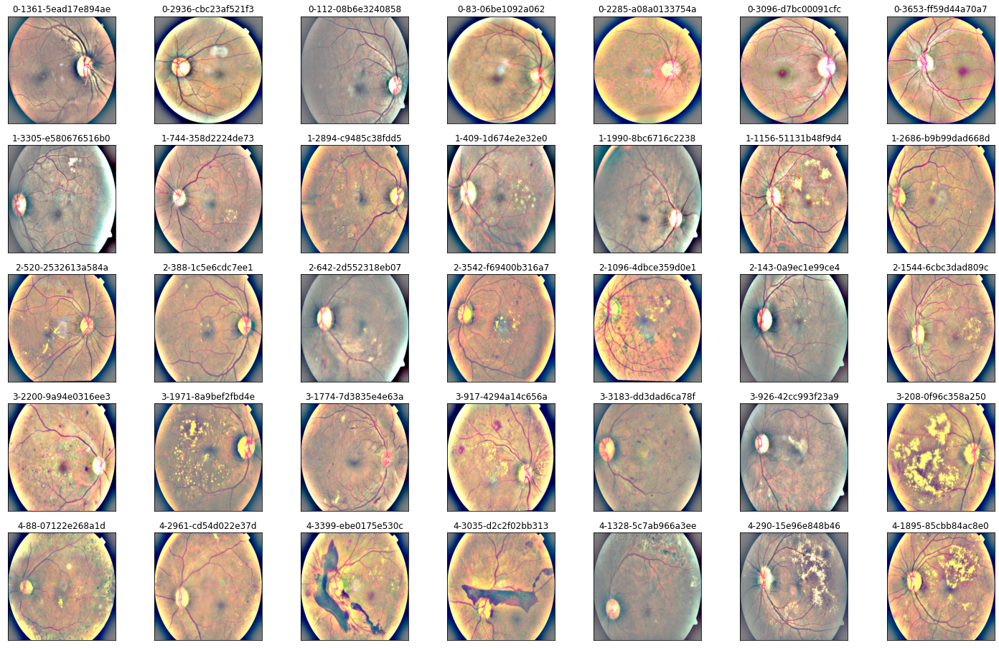

In [0]:
%%time

NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"drive/My Drive/train_images/{row['id_code']}.png"
        image = load_ben_color(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (class_id, idx, row['id_code']) )

# **3.1 Try the new idea of circle crop**

In [0]:
def circle_crop(img, sigmaX=10):   
    """
    Create circular crop around image centre    
    """    
    
    img = cv2.imread(img)
    img = crop_image_from_gray(img)    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    height, width, depth = img.shape    
    
    x = int(width/2)
    y = int(height/2)
    r = np.amin((x,y))
    
    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
    img=cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , sigmaX) ,-4 ,128)
    return img 

CPU times: user 1min 27s, sys: 205 ms, total: 1min 27s
Wall time: 49.4 s


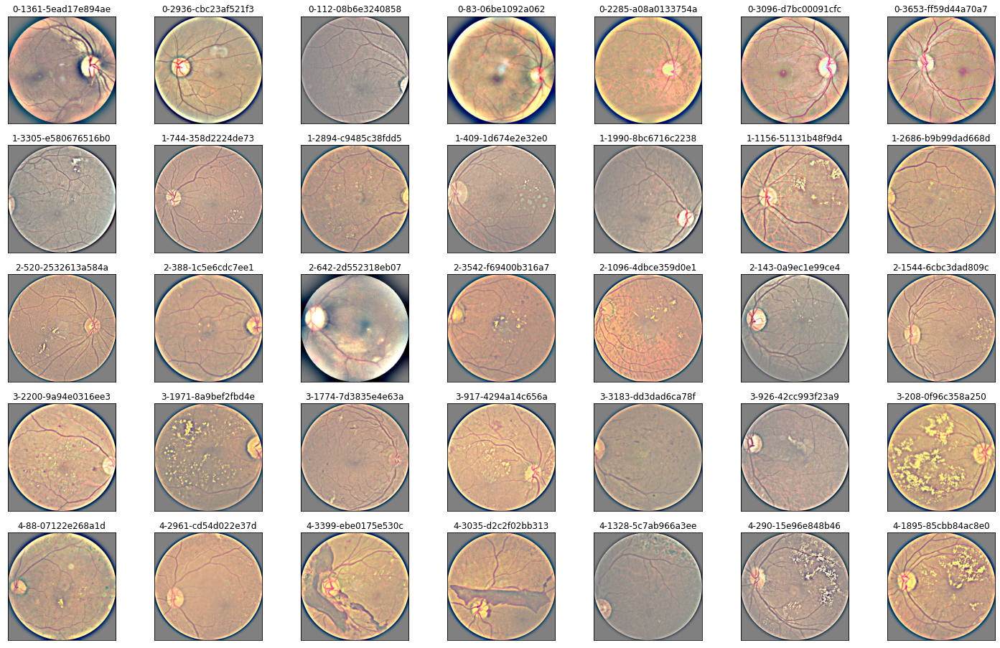

In [0]:
%%time
## try circle crop
NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"drive/My Drive/train_images/{row['id_code']}.png"
        image = circle_crop(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (class_id, idx, row['id_code']) )


**We can try plotting a picture (sample train pic(4,1) above) with IMG_SIZE   with cropping, now important information is much clearer to see with sigmaX = 10**

512 512


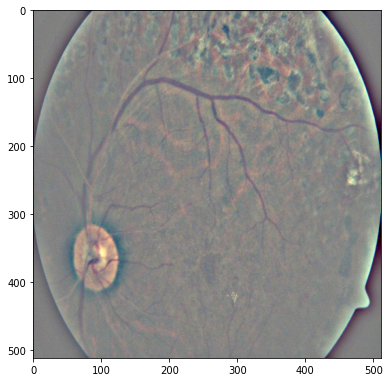

In [0]:
dpi = 80 #inch
path=f"drive/My Drive/train_images/5c7ab966a3ee.png" # notice upper part
image = load_ben_color(path,sigmaX=10)

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE=1
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

512 512


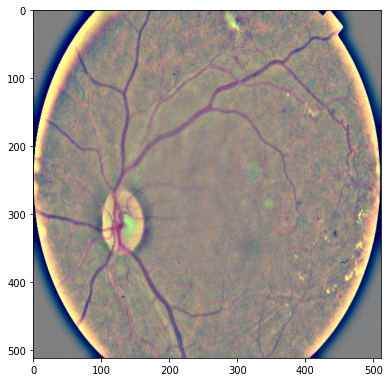

In [0]:
dpi = 80 #inch
path=f"drive/My Drive/train_images/cd54d022e37d.png" # lower-right, can be class3
image = load_ben_color(path,sigmaX=10)

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE=1
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

# Comapring the Original and Transformed image...

512 512


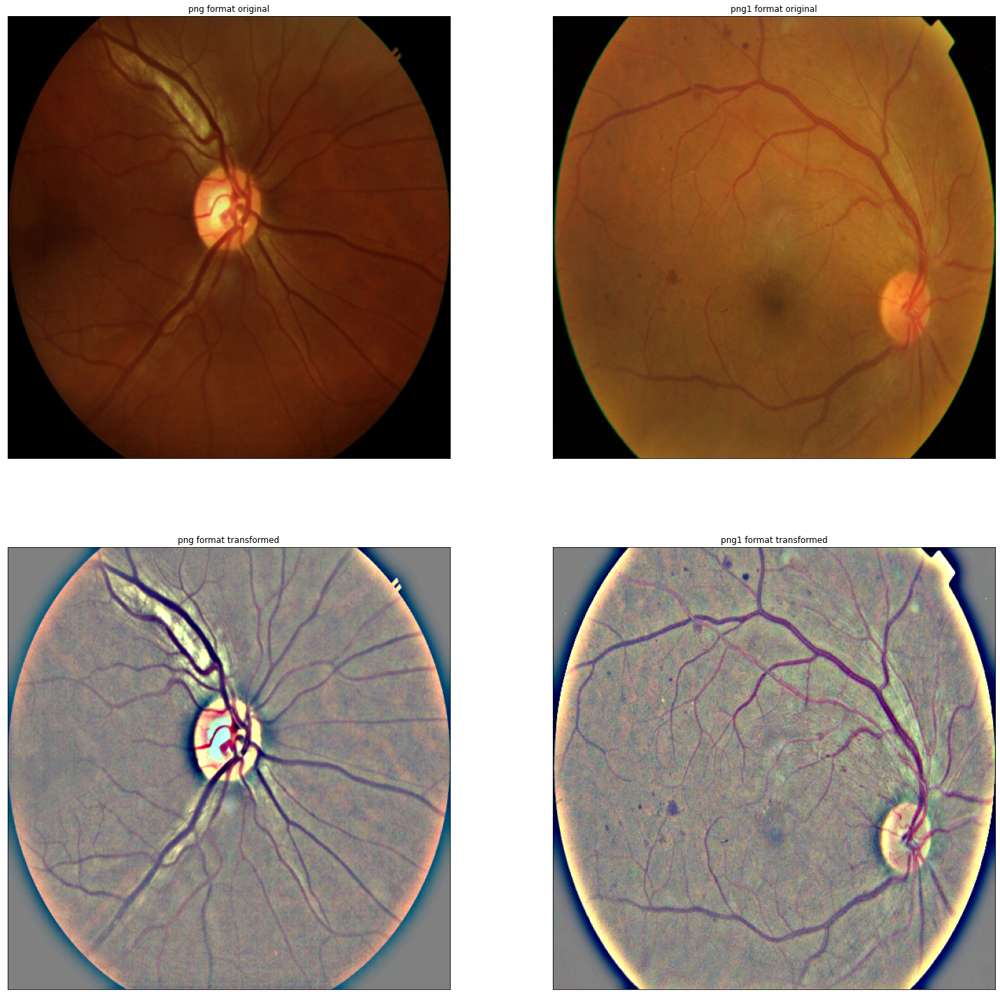

In [0]:
dpi = 80 #inch
path_png=f"drive/My Drive/train_images/cd563556cb57.png" # details are lost
path_png1=f"drive/My Drive/train_images/cd9e2190c73f.png" # details are lost
image = cv2.imread(path_png)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = crop_image(image)
image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

image2 =  cv2.imread(path_png1)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2 = crop_image(image2)
image2 = cv2.resize(image2, (IMG_SIZE, IMG_SIZE))


height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE=1/4
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(2, 2, 1, xticks=[], yticks=[])
ax.set_title('png format original' )
plt.imshow(image, cmap='gray')
ax = fig.add_subplot(2, 2, 2, xticks=[], yticks=[])
ax.set_title('png1 format original' )
plt.imshow(image2, cmap='gray')

image = load_ben_color(path_png,sigmaX=10)
image2 = load_ben_color(path_png1,sigmaX=10)
ax = fig.add_subplot(2, 2, 3, xticks=[], yticks=[])
ax.set_title('png format transformed' )
plt.imshow(image, cmap='gray')
ax = fig.add_subplot(2, 2, 4, xticks=[], yticks=[])
ax.set_title('png1 format transformed' )
plt.imshow(image2, cmap='gray')